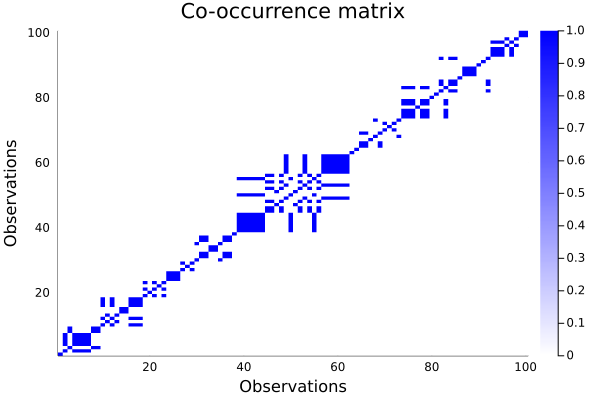

In [46]:
include("../ntl.jl")
import Random

using LinearAlgebra
Random.seed!(1)

data_covariance = Matrix{Float64}(0.1I, 2, 2)
prior_covariance = Matrix{Float64}(I, 2, 2)
prior_mean = Vector{Float64}(zeros(2))
data_parameters = Ntl.Models.GaussianParameters(data_covariance, prior_mean, prior_covariance)

psi_prior = Vector{Float64}([1, 1])
phi_prior = Vector{Float64}([1, 1])
geometric_arrival = Ntl.Models.GeometricArrivals(prior=phi_prior, sample_parameter_posterior=true)
ntl_cluster_parameters = Ntl.Models.NtlParameters(
    psi_prior, 
    geometric_arrival, 
    sample_parameter_posterior=false
)

mixture_model = Ntl.Models.Mixture(ntl_cluster_parameters, data_parameters)
n = 100
mixture = Ntl.Generate.generate(mixture_model, n=n)
data = Matrix(transpose(Matrix(mixture[:, 2:end])))
training_data = data[:, 1:n]
true_clustering = mixture[:, 1]
true_number_of_clusters = length(unique(true_clustering))
Ntl.Plot.plot_co_occurrence_matrix(true_clustering)

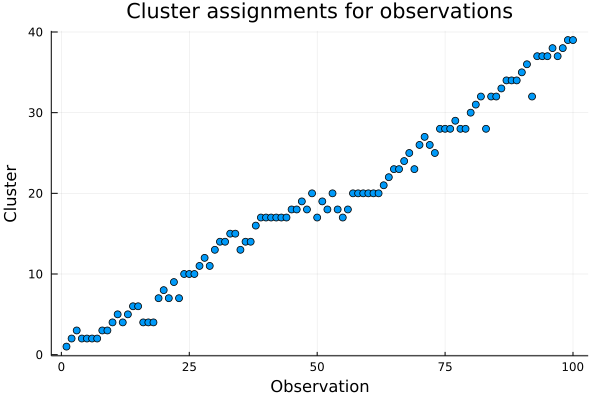

In [2]:
Ntl.Plot.plot_assignments(true_clustering)

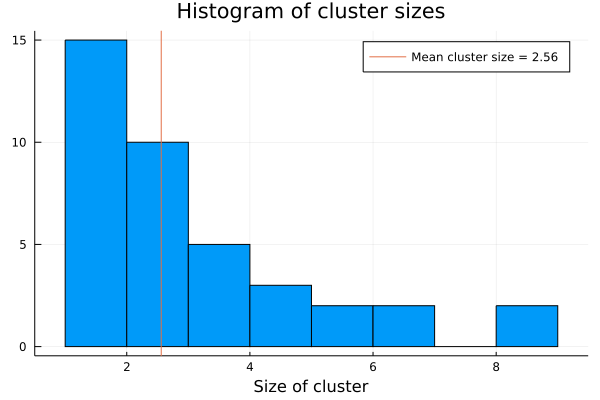

In [3]:
Ntl.Plot.plot_cluster_sizes_histogram(true_clustering)

In [4]:
gibbs_sampler = Ntl.Samplers.GibbsSampler(num_iterations=3000, num_burn_in=0, 
                                          assignment_types=["random", "all same cluster", "all different clusters"])
gibbs_output = Ntl.Fitter.fit(training_data, mixture_model, gibbs_sampler)

Progress: 100%|█████████████████████████████████████████| Time: 0:05:38
Progress: 100%|█████████████████████████████████████████| Time: 0:06:15
Progress: 100%|█████████████████████████████████████████| Time: 0:07:17


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 2 … 2 2; … ; 81 75 … 99 99; 74 100 … 99 …
  "arrival posterior" => [0.106169 0.000670491 0.990661; 0.163669 0.0818323 0.9…
  "log likelihood"    => [-670.466 -428.843 -473.514; -689.292 -572.603 -492.35…

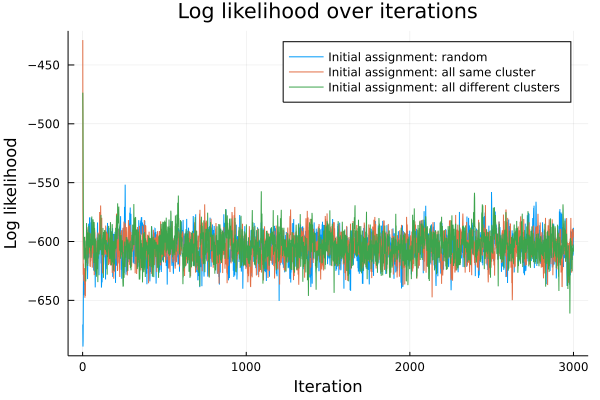

In [5]:
Ntl.Plot.plot_log_likelihoods(
    gibbs_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types
)

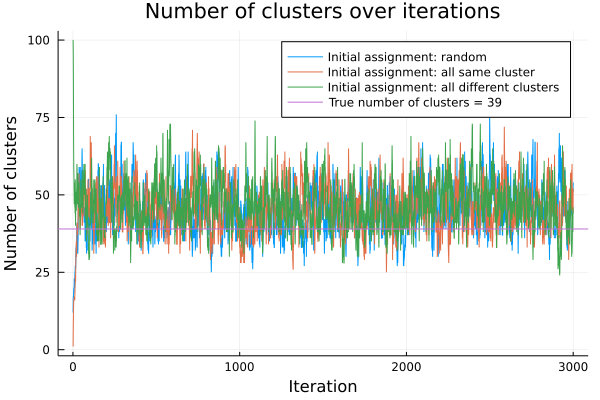

In [6]:
Ntl.Plot.plot_num_clusters(
    gibbs_output["assignments"], 
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

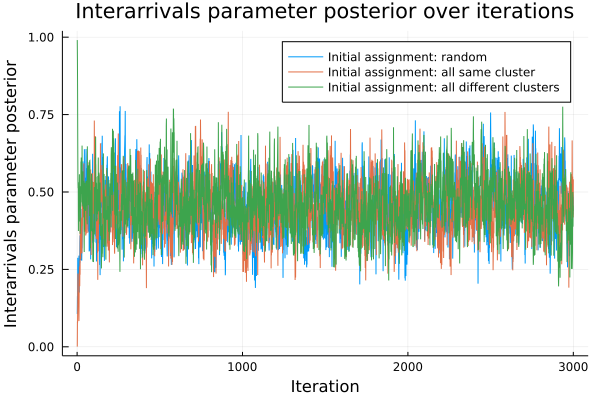

In [7]:
Ntl.Plot.plot_trace(
    gibbs_output["arrival posterior"], 
    ylabel="Interarrivals parameter posterior",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


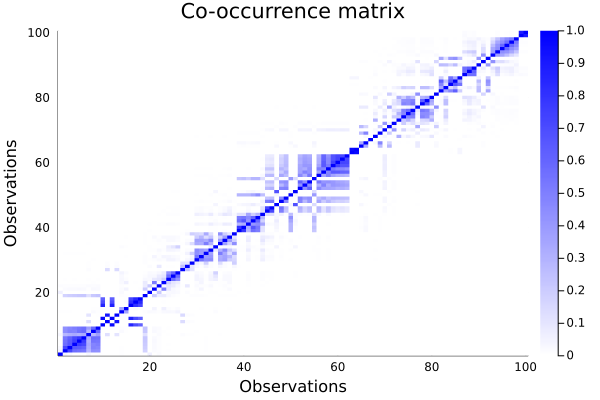

In [8]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_output["assignments"][:, :, 1], num_burn_in=1500)

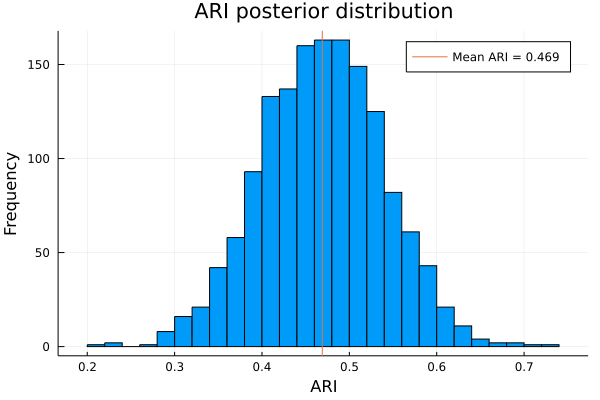

In [47]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)

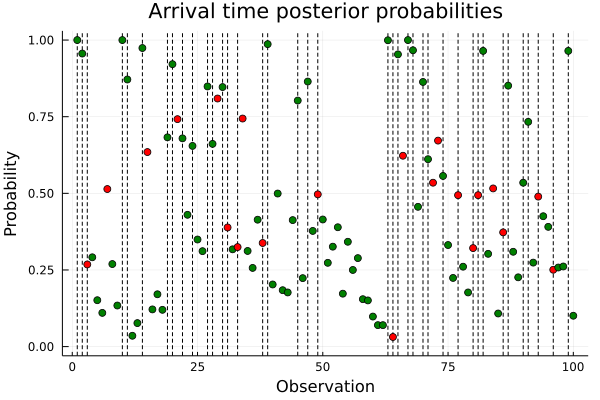

In [10]:
Ntl.Plot.plot_arrival_posterior_probabilities(
    gibbs_output["assignments"][:, :, 1], 
    true_clustering, 
    num_burn_in=1500
)

In [11]:
gibbs_map_estimate = Ntl.Utils.map_estimate(
    gibbs_output["assignments"][:, :, 1], 
    gibbs_output["log likelihood"][:, 1], 
    num_burn_in=1500
)
gibbs_map_ari = Ntl.Utils.adjusted_rand_index(gibbs_map_estimate, true_clustering)
println("MAP Estimate ARI = $gibbs_map_ari")

MAP Estimate ARI = 0.211169542996815


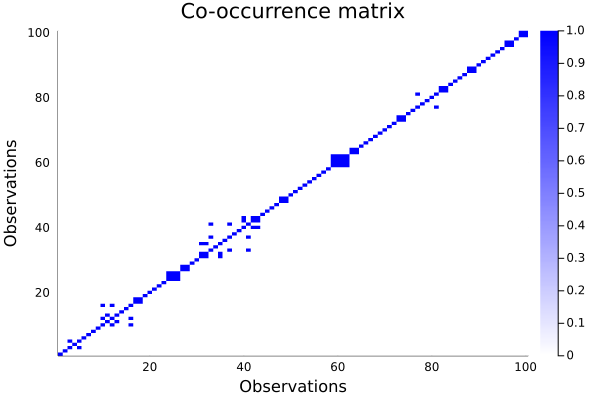

In [12]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_map_estimate)

In [13]:
gibbs_minbinder_estimate = Ntl.Utils.minbinder(
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)
gibbs_minbinder_ari = Ntl.Utils.adjusted_rand_index(gibbs_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $gibbs_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01
┌ Warning: RCall.jl: Loading required package: lpSolve
└ @ RCall /Users/seanla/.julia/packages/RCall/3mHXJ/src/io.jl:160


MinBinder estimate ARI = 0.35616691697845415


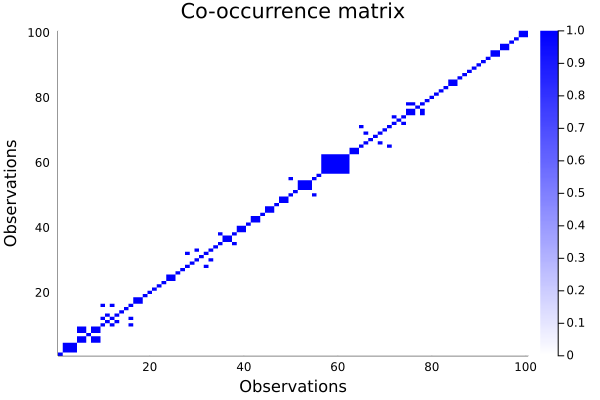

In [14]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minbinder_estimate)

In [15]:
gibbs_minVI_estimate = Ntl.Utils.minVI(
    gibbs_output["assignments"][:, :, 1], 
    num_burn_in=1500
)
gibbs_minVI_ari = Ntl.Utils.adjusted_rand_index(gibbs_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $gibbs_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


Min VI Estimate ARI = 0.5570721538288533


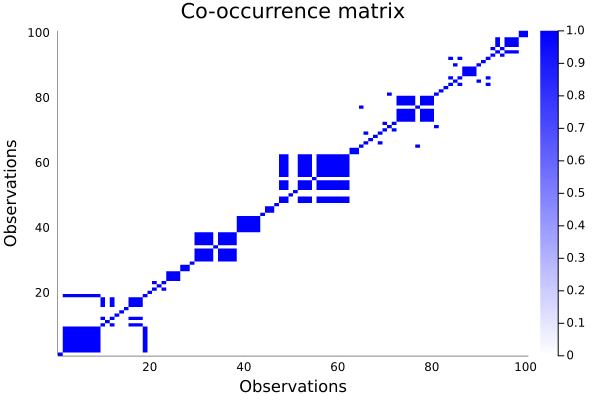

In [16]:
Ntl.Plot.plot_co_occurrence_matrix(gibbs_minVI_estimate)

In [17]:
metropolis_hastings_sampler = Ntl.Samplers.MetropolisHastingsSampler(
    num_iterations=10000, 
    num_burn_in=0, 
    proposal_radius=5, 
    skip=1, 
    adaptive=false,                                                  
    assignment_types=["random", "all same cluster", "all different clusters"]
)
mcmc_output = Ntl.Fitter.fit(training_data, mixture_model, metropolis_hastings_sampler) 

Progress: 100%|█████████████████████████████████████████| Time: 0:00:33
Progress: 100%|█████████████████████████████████████████| Time: 0:00:26
Progress: 100%|█████████████████████████████████████████| Time: 0:00:30


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 1 … 2 2; … ; 64 64 … 99 99; 97 97 … 99 9…
  "arrival posterior" => [0.159585 0.0233218 0.995856; 0.197267 0.0287365 0.955…
  "log likelihood"    => [-651.975 -428.843 -473.514; -678.897 -485.725 -488.27…

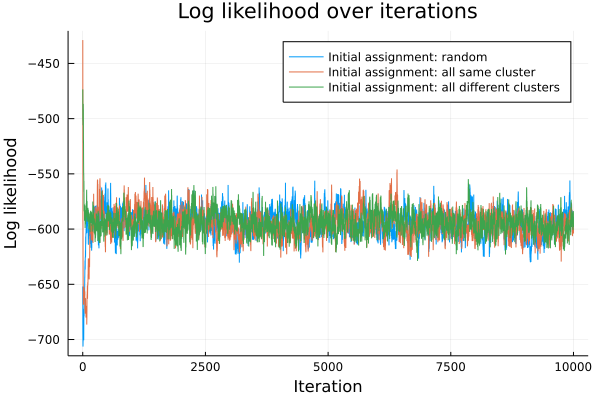

In [18]:
Ntl.Plot.plot_log_likelihoods(
    mcmc_output["log likelihood"],
    assignment_types=metropolis_hastings_sampler.assignment_types
)

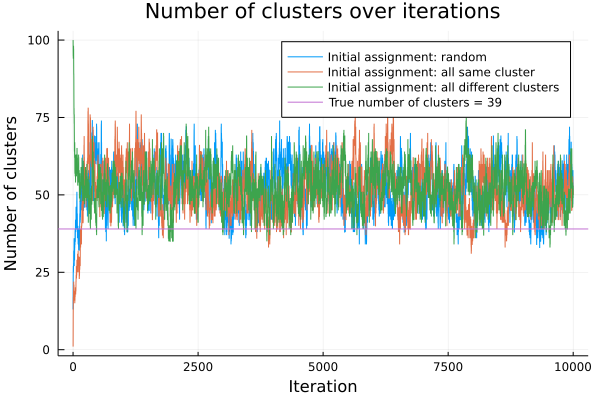

In [19]:
Ntl.Plot.plot_num_clusters(
    mcmc_output["assignments"], 
    true_number=true_number_of_clusters,
    assignment_types=metropolis_hastings_sampler.assignment_types
)

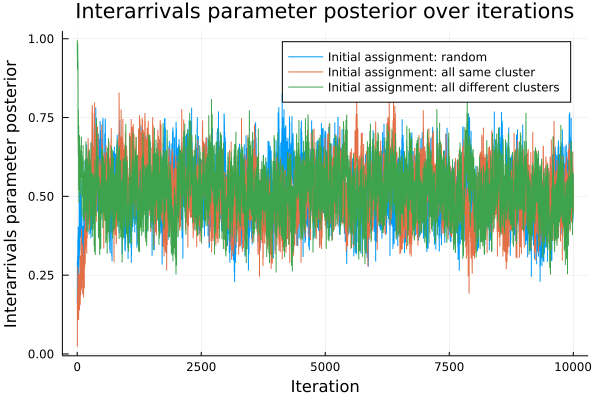

In [20]:
Ntl.Plot.plot_trace(
    mcmc_output["arrival posterior"], 
    ylabel="Interarrivals parameter posterior",
    assignment_types=metropolis_hastings_sampler.assignment_types
)

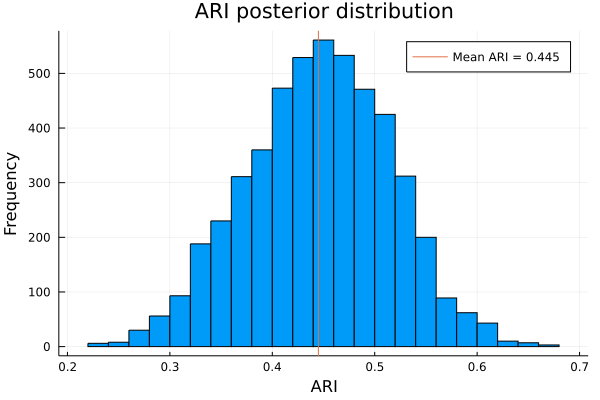

In [48]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


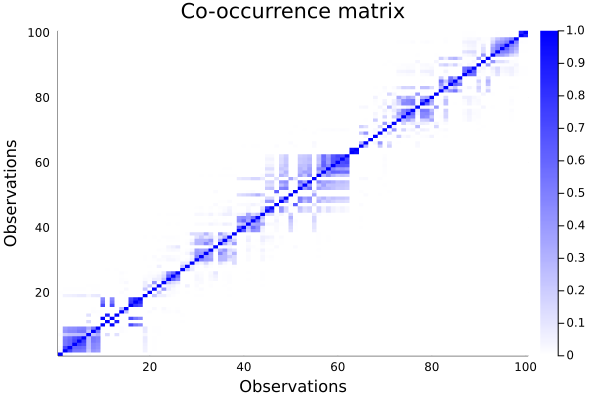

In [22]:
Ntl.Plot.plot_co_occurrence_matrix(
    mcmc_output["assignments"][:, :, 1],
    num_burn_in=5000
)

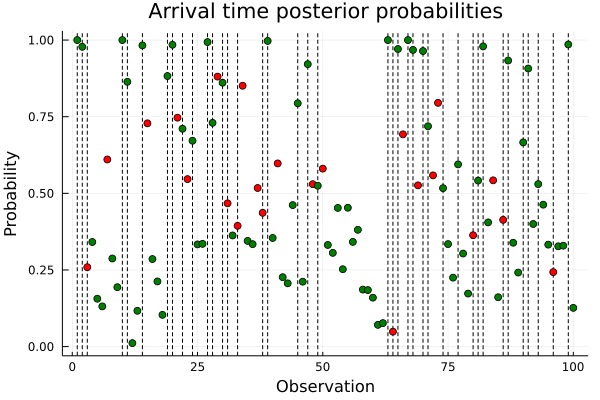

In [23]:
Ntl.Plot.plot_arrival_posterior_probabilities(
    mcmc_output["assignments"][:, :, 1], 
    true_clustering, 
    num_burn_in=5000
)

In [24]:
mcmc_map_estimate = Ntl.Utils.map_estimate(
    mcmc_output["assignments"][:, :, 1], 
    mcmc_output["log likelihood"][:, 1], 
    num_burn_in=5000
)
mcmc_map_ari = Ntl.Utils.adjusted_rand_index(mcmc_map_estimate, true_clustering)
println("MAP Estimate ARI = $mcmc_map_ari")

MAP Estimate ARI = 0.3242219913693226


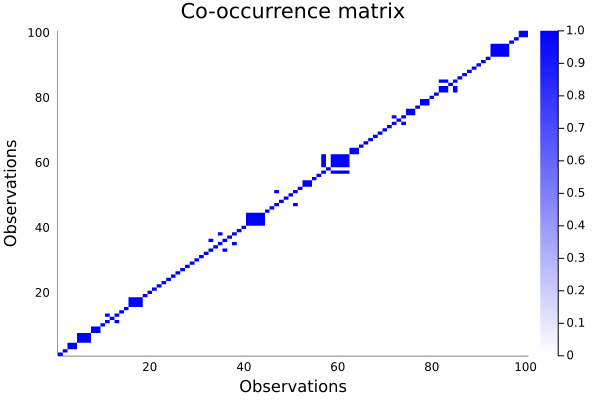

In [25]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_map_estimate)

In [26]:
mcmc_minbinder_estimate = Ntl.Utils.minbinder(
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)
mcmc_minbinder_ari = Ntl.Utils.adjusted_rand_index(mcmc_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $mcmc_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


MinBinder estimate ARI = 0.5096809722956793


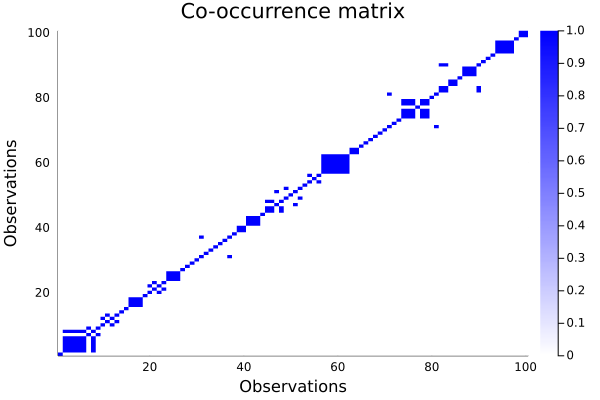

In [27]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minbinder_estimate)

In [28]:
mcmc_minVI_estimate = Ntl.Utils.minVI(
    mcmc_output["assignments"][:, :, 1], 
    num_burn_in=5000
)
mcmc_minVI_ari = Ntl.Utils.adjusted_rand_index(mcmc_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $mcmc_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:03


Min VI Estimate ARI = 0.5020162128455616


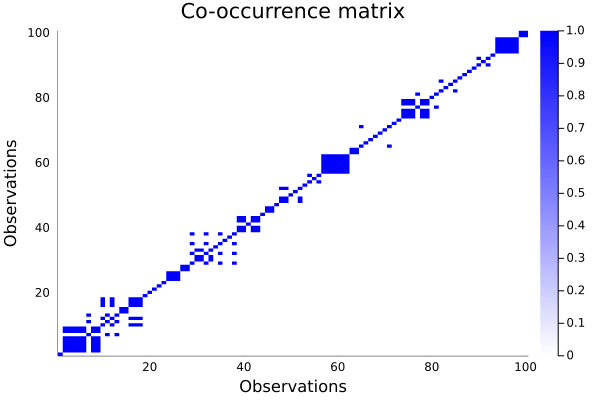

In [29]:
Ntl.Plot.plot_co_occurrence_matrix(mcmc_minVI_estimate)

In [30]:
dp_cluster_parameters = Ntl.Models.DpParameters(1, sample_parameter_posterior=true)
dp_mixture = Ntl.Models.Mixture(dp_cluster_parameters, data_parameters)
gibbs_sampler = Ntl.Samplers.GibbsSampler(
    num_iterations=50000, 
    num_burn_in=0,            
    assignment_types=["random", "all same cluster", "all different clusters"]
)
dp_output = Ntl.Fitter.fit(training_data, dp_mixture, gibbs_sampler)

Progress: 100%|█████████████████████████████████████████| Time: 0:09:32
Progress: 100%|█████████████████████████████████████████| Time: 0:08:05
Progress: 100%|█████████████████████████████████████████| Time: 0:07:48


Dict{String, Array} with 3 entries:
  "assignments"       => [1 1 … 1 1; 1 2 … 2 2; … ; 17 11 … 99 99; 37 11 … 4 22…
  "cluster parameter" => [1.64693 1.0 1.0; 2.62123 1.0 1.45442; … ; 93.3331 70.…
  "log likelihood"    => [-684.585 -428.843 -832.648; -708.344 -591.328 -794.47…

In [31]:
Ntl.Plot.plot_log_likelihoods(
    dp_output["log likelihood"],
    assignment_types=gibbs_sampler.assignment_types
)

In [32]:
Ntl.Plot.plot_num_clusters(
    dp_output["assignments"],
    true_number=true_number_of_clusters,
    assignment_types=gibbs_sampler.assignment_types
)

In [33]:
Ntl.Plot.plot_trace(
    dp_output["cluster parameter"],
    ylabel="alpha",
    assignment_types=gibbs_sampler.assignment_types
)

Progress: 100%|█████████████████████████████████████████| Time: 0:00:13


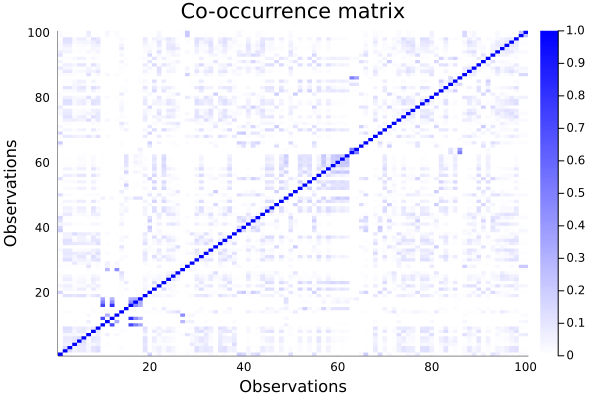

In [34]:
Ntl.Plot.plot_co_occurrence_matrix(dp_output["assignments"][:, :, 1], num_burn_in=25000)

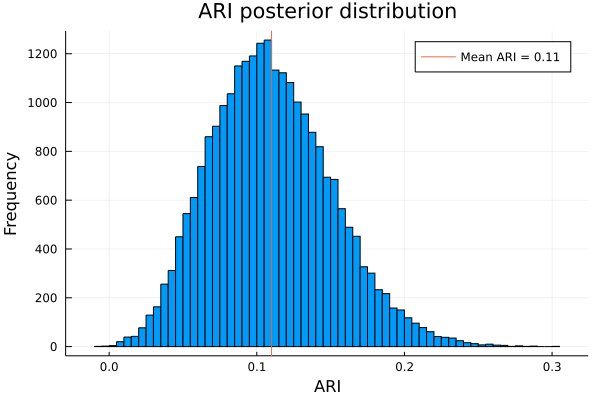

In [49]:
Ntl.Plot.plot_ari_posterior_distribution(
    true_clustering, 
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)

In [36]:
dp_map_estimate = Ntl.Utils.map_estimate(
    dp_output["assignments"][:, :, 1], 
    dp_output["log likelihood"][:, 1], 
    num_burn_in=25000
)
dp_map_ari = Ntl.Utils.adjusted_rand_index(dp_map_estimate, true_clustering)
println("MAP Estimate ARI = $dp_map_ari")

MAP Estimate ARI = 0.013617500469212653


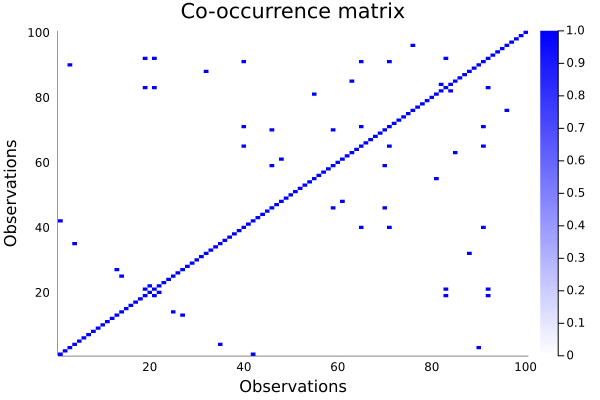

In [37]:
Ntl.Plot.plot_co_occurrence_matrix(dp_map_estimate)

In [38]:
dp_minbinder_estimate = Ntl.Utils.minbinder(
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)
dp_minbinder_ari = Ntl.Utils.adjusted_rand_index(dp_minbinder_estimate, true_clustering)
println("MinBinder estimate ARI = $dp_minbinder_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:15


MinBinder estimate ARI = 0.07243661064589883


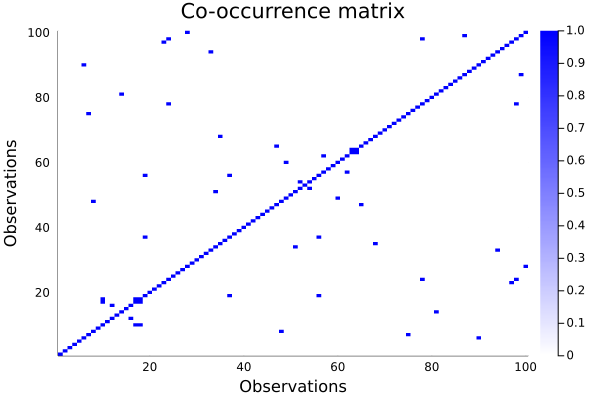

In [39]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minbinder_estimate)

In [40]:
dp_minVI_estimate = Ntl.Utils.minVI(
    dp_output["assignments"][:, :, 1], 
    num_burn_in=25000
)
dp_minVI_ari = Ntl.Utils.adjusted_rand_index(dp_minVI_estimate, true_clustering)
println("Min VI Estimate ARI = $dp_minVI_ari")

Progress: 100%|█████████████████████████████████████████| Time: 0:00:12


Min VI Estimate ARI = 0.0922199120186878


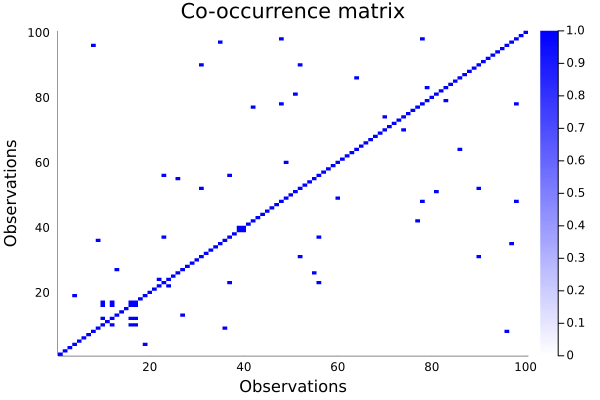

In [41]:
Ntl.Plot.plot_co_occurrence_matrix(dp_minVI_estimate)

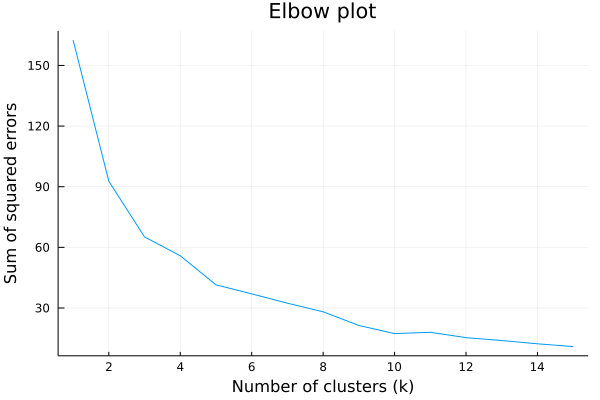

In [42]:
Ntl.Plot.plot_kmeans_elbow(training_data, max_num_clusters=15)

In [43]:
using Clustering
kmeans_num_clusters = 10
final_kmeans_result = kmeans(training_data, kmeans_num_clusters)
kmeans_clustering = final_kmeans_result.assignments

100-element Vector{Int64}:
  5
  7
  7
  4
  4
  4
  2
  9
  4
 10
  8
 10
  8
  ⋮
  2
  9
  5
  9
  5
  7
  7
  7
  7
  7
  2
  2

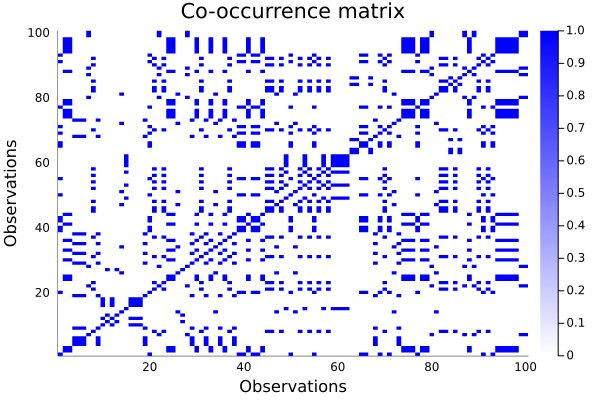

In [44]:
Ntl.Plot.plot_co_occurrence_matrix(kmeans_clustering)

In [45]:
kmeans_ari = Ntl.Utils.adjusted_rand_index(kmeans_clustering, true_clustering)
print("K-means clustering ARI = $kmeans_ari")

K-means clustering ARI = 0.20916384255425122